# **Fake News Detection - Module 1**

#Agenda

1. Project Description and Objectives
2. Description of the Data and Source
3. Data Preprocessing
4. Data Analysis
5. Appendix


# Project Description and Objectives

Early fake news detection aims to give early alerts
of fake news during the dissemination process before it
reaches a broad audience. Therefore, early fake news detection methods are highly desirable and socially beneficial.

The goal of this project is to detect fake news shared on social media, specifically on Twitter. A binary classification machine learning model will be developed to detect patterns in the article or post, it will classify the news as Fake(1) or Real(0).


In the data analysis part, aside from analyzing the news contents and titles using Natural Language Processign techniques, we also analyzed the social interaction dynamics in fake and real news dissemination on Twitter.

# Description of the Data and Source
In this project we used datasets from FakeNewsNet repository (https://github.com/KaiDMML/FakeNewsNet). This repository contains a collection of almost 24,000 articles collected in 2018 from two different sources:

* __PolitiFact.com__: PolitiFact is a nonprofit project that relies on the collaboration of journalists and policy experts to evaluate the veracity of political news. In FakeNewsNet we can find more than 1000 articles classified by PolitiFact in two categories: Real and Fake News.


* __Gossip Cop__: Gossip Cop (now part of Suggest.com) is a website that fact-checks celebrity reporting. In contrast with PoliFact, Gossip Cop provides a rating in the scale 0-10 for every article on the website. A higher rating means a higher confidence that the story is true. Since Gossip Cop focus is to find Fake News, most of the news from Gossip Cop are Fake News (rating lesser than 5). Therefore, Gossip Cop is the source of Fake News while the celebrity news labeled as real come from E! Online, a well-known trusted media website for publishing entertainment news pieces. However, there have not been any verification process for the news in E! Online and, therefore, the reliability of this part of the data is not as high as in the case of PoliFact.

There are 4 datasets available in the official FakeNewsNet repository:
* *gossipcop_fake.csv*: dataset with the fake news collected from Gossip Cop and E! Online
* *gossipcop_real.csv*: dataset with the real news collected from Gossip Cop and E! Online
* *politifact_fake.csv*: dataset with the fake news collected from PolitiFact
* *politifact_real.csv*: dataset with the real news collected from PolitiFact

All of them include the same columns. In the next cell, first lines of *gossipcop_fake.csv* are displayed:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import pandas as pd
polifact_fake = pd.read_csv('/content/drive/MyDrive/243/FakeNewsNet/dataset/politifact_fake.csv')
polifact_fake.head()

,id,news_url,title,tweet_ids
0,politifact15014,speedtalk.com/forum/viewtopic.php?t=51650,BREAKING: First NFL Team Declares Bankruptcy O...,937349434668498944\t937379378006282240\t937380...
1,politifact15156,politics2020.info/index.php/2018/03/13/court-o...,Court Orders Obama To Pay $400 Million In Rest...,972666281441878016\t972678396575559680\t972827...
2,politifact14745,www.nscdscamps.org/blog/category/parenting/467...,UPDATE: Second Roy Moore Accuser Works For Mic...,929405740732870656\t929439450400264192\t929439...
3,politifact14355,https://howafrica.com/oscar-pistorius-attempts...,Oscar Pistorius Attempts To Commit Suicide,886941526458347521\t887011300278194176\t887023...
4,politifact15371,http://washingtonsources.org/trump-votes-for-d...,Trump Votes For Death Penalty For Being Gay,915205698212040704\t915242076681506816\t915249...


The data included in every dataframe are:
* __id__: unique id for all news
* __news_url__: url where the news were published
* __title__: full title of the news
* __tweets_ids__: as we will see below, the FakeNewsNet repository includes also a collection of tweets mentioning every article

Since the only data availible in this repository to classify the news are titles and URLs, we have scrapped two different kinds of additional data:

* __News data__: using Newspaper, a Python module used for extracting and parsing newspaper articles, we have downloaded the __body__ and __publish date__ of most of the news of FakeNewsNet.


* __Tweets data__: one of the advantages over other popular Fake News repositories is that it includes not only a collection of news items but also information on the impact of these news items on social networks. To do that the original dataset includes the unique tweet identifiers (tweet_id) of all the tweets mentioning the news at the moment the repository was created (2018). We faced a challenge when we started the project, since a large number of the referenced tweets have been deleted from Twitter, especially those mentioning Fake News, so we cannot use the official Twitter APIs. We used Snscrape as an alternative option, a scraper for social networking services. The advantage of Snscrape is that the data is downloaded from a historical log of tweets, which has allowed us to access most of the tweets. This way we have scrapped:
 * __date and time__ of publication of every tweet
 * __text__ of every tweet
 * __number of retweets, likes, replies and quotes__ for every tweet

# Data Pre-processing

**Data Cleaning**



1.   We first **merged all the datasets**, by: 
*   adding a column **'target'** equals to 0 if the news is fake and to 1 if the news is real
*   adding a column **'source'** equal to 'gossipcop' or 'politifact' (depending of the dataset the news come from) and creating a distinct 'id' with the news id

2.   For the column **'tweets'** : we splitted the 'tweets' column into a list of 'tweets': the tweets where only separated by '\t' and were merge into a single string. We also added a column with the number of tweets for each news


```
df['tweet_ids'] = df['tweet_ids'].astype(str)
df['tweet_ids'] = df['tweet_ids'].apply(lambda x: str(x).replace('\t',' '))
df['tweet_ids'] = df['tweet_ids'].apply(lambda x: re.split(r' ', x))
```



3. For the column **'news_url'**: we added the string 'http://' at the beginning of the url which were missing this part



```
df['news_url']=df['news_url'].apply(lambda x: 'http://'+str(x) if str(x)[0:4]!='http' else x)
```



4. We created a new column **'source_url'**: in which we try to get the source of the news (New York Times, Variety, DailyMail etc.) with the url link. We used the string from the url to get the information, but the outcome is not perfect

```
# df2["source_url"] = df2['news_url'].apply(lambda x: x.split("/")[2].replace("www.","").replace("web.","")
.replace("select.","").split(".")[0])
```





**News scrapping part**

We used the packages **newspaper3k** and **nltk** to scrap the articles' data on the internet.

The goal was to get the text (**'body'**) and the publish date (**'date'**) of the articles. We tried to get the 'keywords' but it did not work, there were all returned as *NaN*.


```
import newspaper
from newspaper import Article
import sys as sys
import pandas as pd

body=[]
date=[]

for link in tqdm(df['news_url']): 
  try:
    article = Article(url= link)
    article.download()
    article.parse()
    successful = True
  except:
    successful = False
  if successful:
    body.append(article.text)
    date.append(article.publish_date)
  else: 
    body.append('error')
    date.append('error')
```



 

1.   We deleted the rows in which the **'body'** was returned as NaN. Indeed,when we cliked on such urls, the page did not exist anymore. They were representing 18% of the articles (4,193 rows out of 23,196)


2.   There was 1 dupplicated element (same article but different **'target'** column), and therefore we deleted it


3.  We transformed the timestamp of **'publish_date'** to a date from *datetime.datetime*


**Tweets scrapping part**

We used the packages **Snscrape** to scrap the tweets' data from 2007 to 2018 using tweet_id from the main datasets. As we want to investigate the social interaction dynamics of each fake and real news tweet, we scrapped tweet information includes posting date and time, number of likes, number of retweets and number of replies. 

The team has scrapped about 1.57 millions of tweets, below are the codes we used to scrape the tweets:

```
pip install --upgrade git+https://github.com/JustAnotherArchivist/snscrape.git

from tqdm import tqdm
import snscrape.modules.twitter as sntwitter

tweet_data = []
for x in tqdm(range(len(df)):
    for t_id in df['tweet_ids'][x]:
        for i,tweet in enumerate(sntwitter.TwitterTweetScraper(tweetId=t_id,mode=sntwitter.TwitterTweetScraperMode.SINGLE)
        .get_items()):
            tweet_data.append([df['id'][x],tweet.id, tweet.date, tweet.content,tweet.retweetCount,tweet.likeCount,
            tweet.replyCount,tweet.quoteCount])

tweet_df = pd.DataFrame(tweet_data, columns=['Id','Tweet_Id','Datetime','Text','Retweet','Like','Reply','Quote'])
```

1. After scrapping all the tweets by batch and saved as 37 csv files
2. We concatenated all the data files and preprocessed the data such as reset index and converted the 'Datetime' column from string to datetime format

Below shows the concatenated tweets dataset:

In [ ]:
tweet_data = pd.read_csv("/content/drive/My Drive/243/FakeNewsNet/dataset/tweets/tweets_clean_data.csv")
tweet_data.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (0,2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Id,Tweet_Id,Datetime,Text,Retweet,Like,Reply
0,2493749932,2.843291e+17,2012-12-27 16:05:08,Did Miley Cyrus and Liam Hemsworth secretly ge...,0.0,0.0,0.0
1,2493749932,2.843327e+17,2012-12-27 16:19:43,Did Miley Cyrus and Liam Hemsworth secretly ge...,0.0,0.0,0.0
2,2493749932,2.843354e+17,2012-12-27 16:30:19,Did Miley Cyrus and Liam Hemsworth secretly ge...,0.0,0.0,0.0
3,2493749932,2.843599e+17,2012-12-27 18:07:42,Afternoon Tea – Daily Link Roundup: Did Miley ...,0.0,0.0,0.0
4,2493749932,2.843854e+17,2012-12-27 19:48:54,Did Miley Cyrus and Liam Hemsworth secretly ge...,0.0,0.0,0.0


3. Next, we merged the main dataset and tweet dataset together using news id, we dropped those columns which are irrelevant to the data analysis
~~~
tweet_df = clean_csv.merge(df, left_on = "Id", right_on = "id", how = 'left')
~~~
Below shows the merged dataset:

In [ ]:
merged_tweet = pd.read_csv("/content/drive/My Drive/243/FakeNewsNet/dataset/tweets/tweets_merged.csv")
merged_tweet.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (0,2,3,4,7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Id,Tweet_Id,Datetime,Text,Retweet,Like,Reply,source,number_tweets,fake_news
0,2493749932,2.843291e+17,2012-12-27 16:05:08,Did Miley Cyrus and Liam Hemsworth secretly ge...,0,0.0,0.0,gossipcop,97.0,0.0
1,2493749932,2.843327e+17,2012-12-27 16:19:43,Did Miley Cyrus and Liam Hemsworth secretly ge...,0,0.0,0.0,gossipcop,97.0,0.0
2,2493749932,2.843354e+17,2012-12-27 16:30:19,Did Miley Cyrus and Liam Hemsworth secretly ge...,0,0.0,0.0,gossipcop,97.0,0.0
3,2493749932,2.843599e+17,2012-12-27 18:07:42,Afternoon Tea – Daily Link Roundup: Did Miley ...,0,0.0,0.0,gossipcop,97.0,0.0
4,2493749932,2.843854e+17,2012-12-27 19:48:54,Did Miley Cyrus and Liam Hemsworth secretly ge...,0,0.0,0.0,gossipcop,97.0,0.0


# Data Analysis

#### **1. Analysis of the sources of the different news: Fake vs. Real for Politics-related news and Gossips-related news**

We first started by plotting the frequency of sources in general in our dataset:

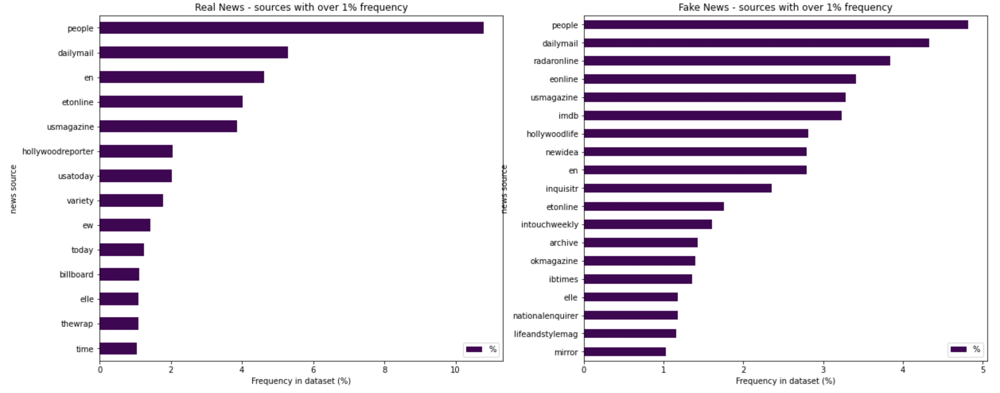

The first element we notice is the fact that there are more different sources for Fake news than for Real news. The sources are more concentrated when it comes to real news. Now, we are doing the same analysis but splitting the data between Fake vs. Real and Gossips vs. Politics news

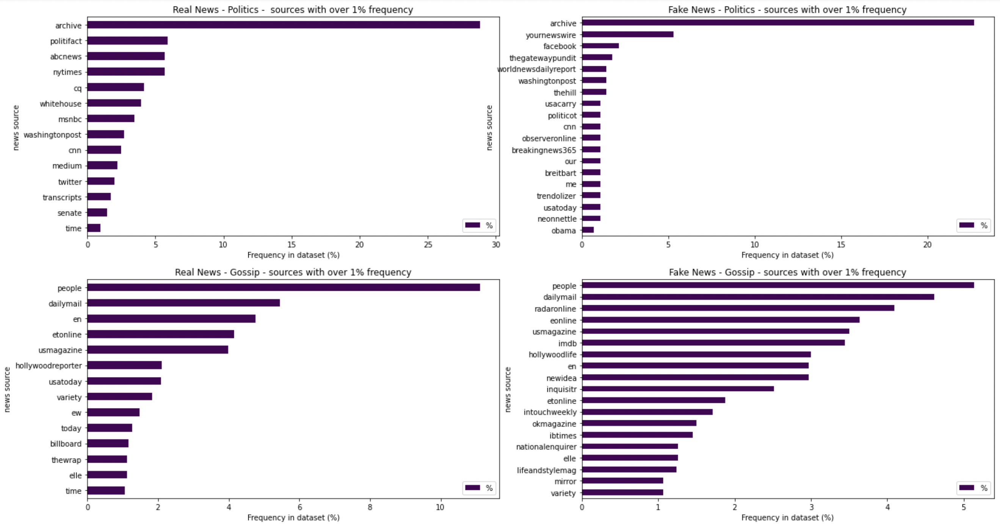

As you may notice, for both Politics and Gossips, the Fake news sources are less concentrated than Real news sources. 

In addition, for Politics news **'archive'**, is not a valuable information since it reprensents an archive from different source. In addition, as mentioned in the data cleaning part, this information is useful to give us an idea of the different journal sources but is not 100% reliable (e.g., the magazine 'en' does not exist). 

The data seems consistent with what we were expecting: newspapers' sources are in general more famous and reliable for Real News (Time, NYTimes vs. Facebook, Yournewswire). Some sources appear in both Real and Fake news rankings.

#### **2. Analysis of the different words in Fake vs. Real news (title & body)**

**Analysis of the title of the articles**

For the title, we notice that the words are more diversified in Real news vs. Fake news in Politics, but it is the opposite in Gossips.

In addition, we can notice that Fake news tend to include in their title celebrities' names more than in Real news, in both Gosspics and Political news.

Here we took the words in the title appearing in at least 3% of the document. 

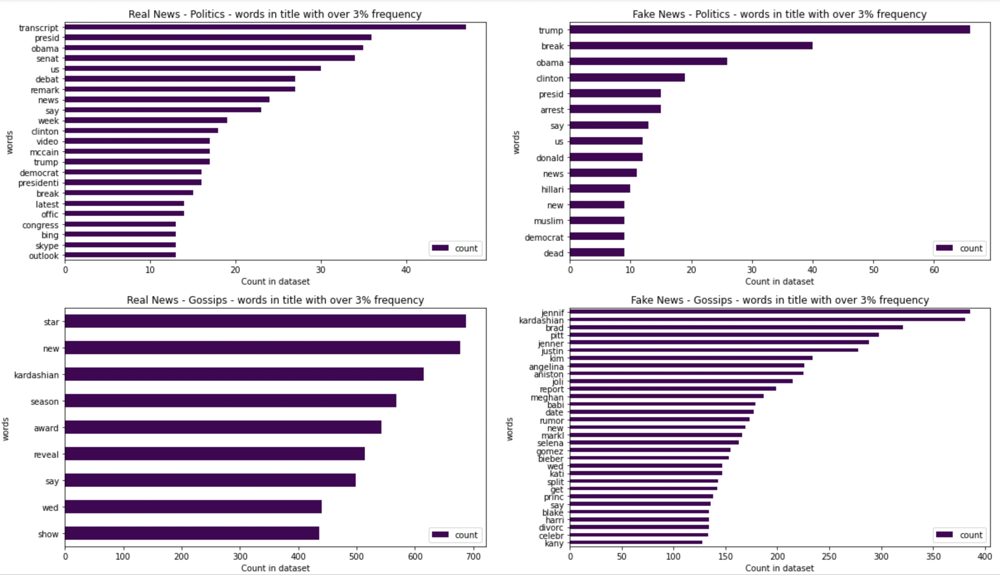

**Analysis of the body of the articles**

In the articles body, we took the data appearing in at least 30% of the documents for all type of news except for Real Politics-related news. For the Politics-related news, the words are way more diversified in the Real news than in the Fake news and also seem to include less evasive words than in Fake news.

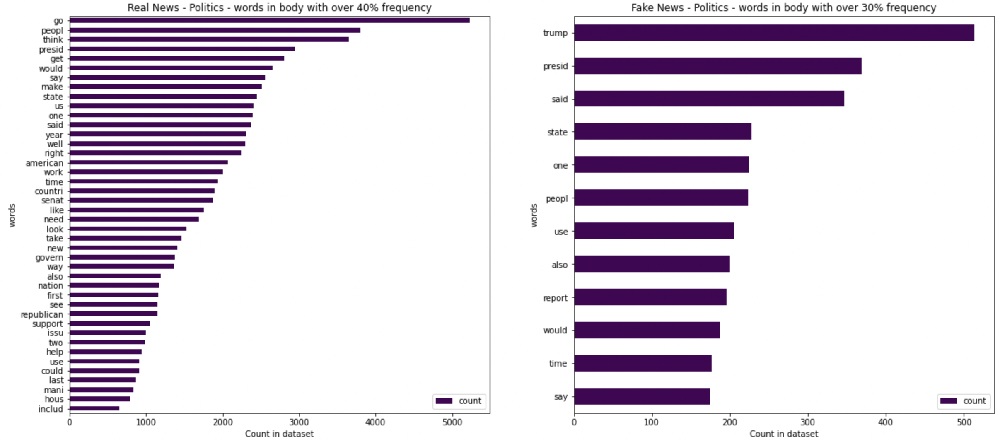

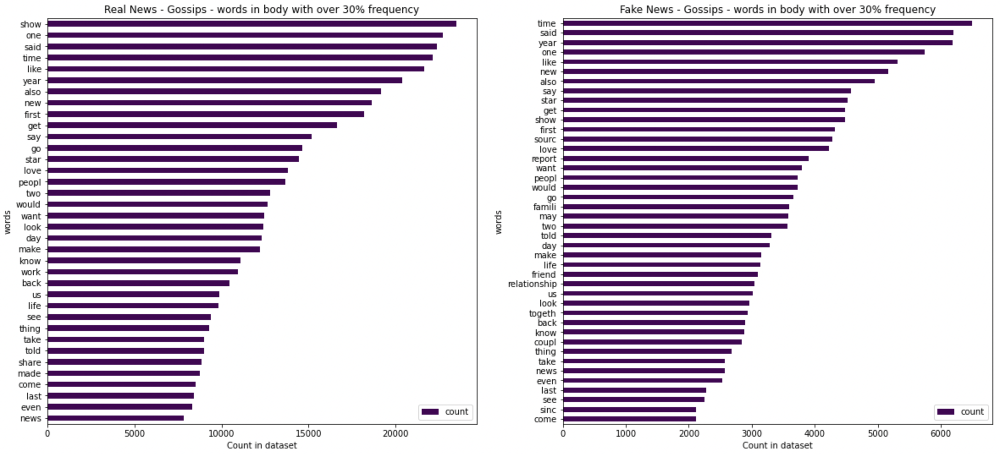

For Gossips-related news, the words are slightly less diversified in the Real news than in the Fake ones. It is difficult to compare the different words as they seem to be very close in meaning in both Fake and Real news.

#### **3.Analysis of the number of tweets generated by each article (Fake vs. Real news)**

**Distribution of the number of tweets**    
The tweets considered here are the ones mentioning the articles. Let's look at the data distribution according to whether the article is fake or real. We might see a relationship between the truthfulness of an article and the number of tweets related to it. First, we will analyze the sum of the tweets and the mean number of tweets per article.

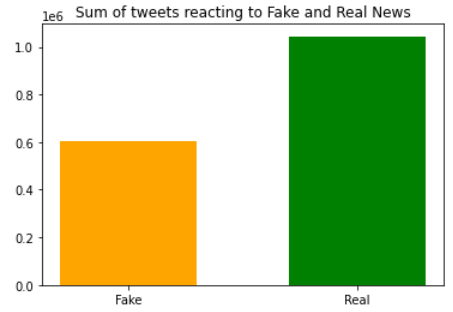
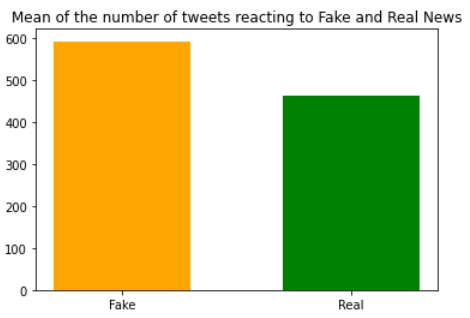

There are almost twice more tweets generated by real articles than by fake articles, but also because the number of real articles is higher than the number of fake ones. Looking at the mean number of tweets per articles, we can notice than, in average, fake articles produced more related tweets than real ones, and this could be useful to identify fake news.

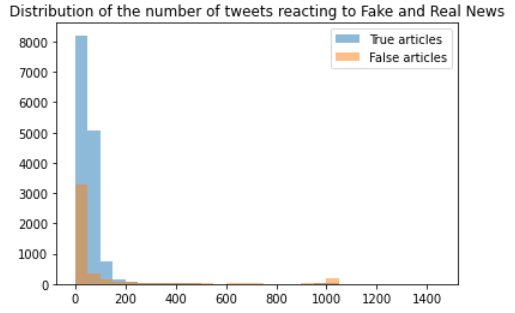

By looking at the histogram of the number of tweets related to the articles, we can see that overall, fake news generate less tweets (mainly between 0 and 50 tweets) than real news (mainly between 0 and 100 tweets). We can notice that a few false articles have a lot of related tweets, as some of them generated more than 1000 tweets, probably some specific hot topics. Real news generally don't generate a huge amount of tweets.

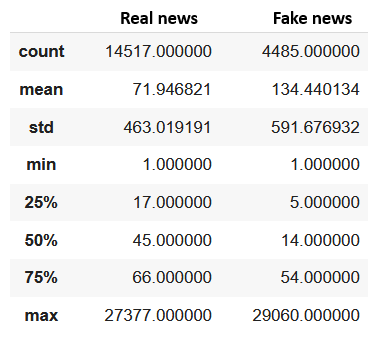

Finally, we can take a closer look at the distribution of the number of tweets data by looking at the table above. Once again, we can see that the mean number of tweets related to a false article is higher than the one related to a real article. The standard deviation is also higher for fake news, so the number of tweets is more scattered. As in both case the standard deviation is high, it is relevant to look at quartiles on top of the mean. In both case, the 75% quartile is very low compared to the maximum value, which suggests than only a few articles talking about hot topics generated a big amount of tweets, especially when it is a false article, for which the median number of tweets is quite low.    
These patterns might be interesting to exploit later to determine the truthfulness of a news.

**Analysis of the impact of the source on the number of tweets**    
The articles come from either politifact or gossipcop. The number of tweets can be impacted by the source of the article, because the source can deal with news more or less famous, and then which would generate more or less tweets.    


Let's split the articles according to whether they are true or false, and their source, and we are going to look at the distribution of the number of tweets.

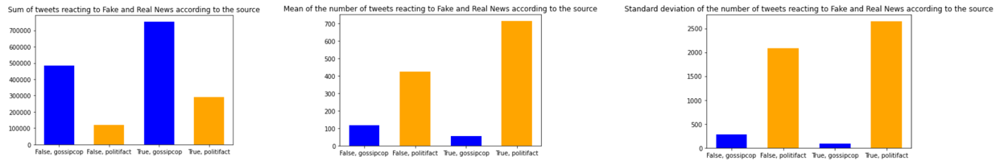

As we can see on the graph of the sum of the number of tweets above, the articles analyzed by gossicop generate much more twwets than the ones from politifact, because there are a lot of articles from gossipcop. By looking at the mean of the number of tweets per article, we can notice that an article from the website politifact generate more tweets in average than those from the article gossipcop. It is probably because politifact analyzed more famous or controversial news than gossipcop. We will have to take into account this bias into our further analysis of the number of tweets.
Although, thanks to the computation of the standard deviation, we see that the number of tweets reacting to an article varies more according to the article for politifact than for gossipcop.

#### **4. Real vs Fake news tweet time for both politicfact and gossip cop datasets**

Here we are trying to investigate the real and fake news tweets posting time and dates for politic-related news and gossip-related news. The heatmaps of the day of week vs hour of tweets posted related to fake and real news are as shown below:

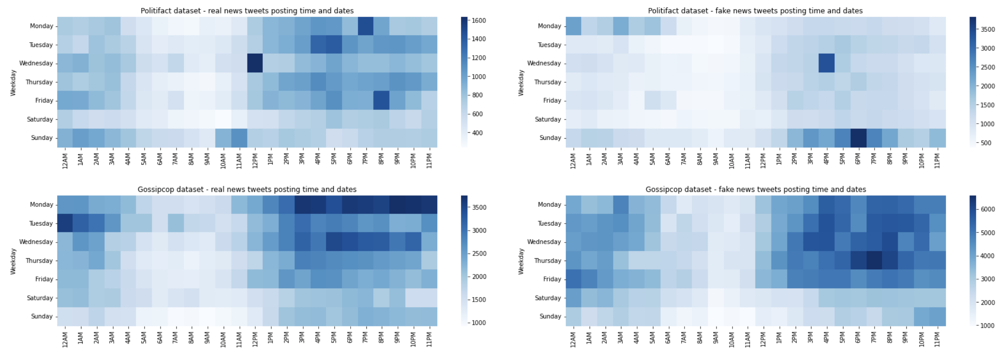

1. For political-related news (politifact dataset), the top-left heatmap shows that real news tweets posting days distributed across Monday to Friday and posting time is distributed between 12pm - 11pm throughout the weekdays, less activities is observed during weekend.

2. While the top-right heatmap shows that fake news tweets posting concentrated on Sunday 2pm - 11pm and Monday 12am - 6am, this might due to some third parties systematically and purposefully disemminate fake news before a new week begins to cause virality during the new week.

3. For gossip-related news (gossipcop dataset), the posting time and days between fake and real news tweets are not too distinguishable. Both tweets were generated across Monday to Friday, between 10am and 3am. This could due to fake gossip news are not disemminate systematically like political-related news, as fake gossip news usually only target at individual celebrities and relatively less impactful than political-related news.


#### **5. User activity on real vs fake news tweets for both politicfact and gossip cop datasets**

In this analysis, we want to evaluate user engagement (like, retweet and reply) for both fake and real news tweets. The differences of the distribution of user behaviors between fake news and real news could have the potential to study users’ beliefs characteristics. 

Similar to previous analysis, we separated the political-related and gossip-related datasets as the user interactions are different in both datasets. We used ternary plots to display three variables (like, retweet and reply) in a single visualization. 0 or orange data point indicates real news, 1 or blue data point indicates fake news:

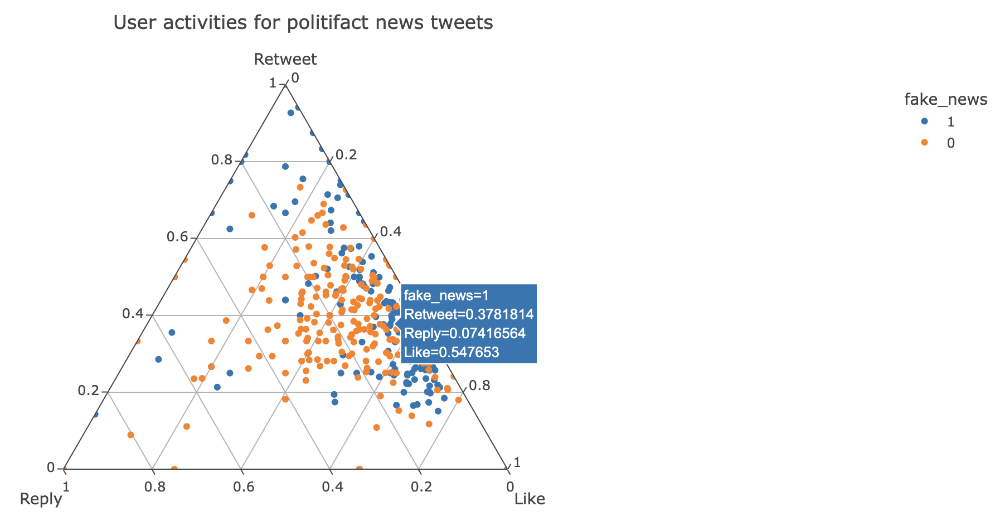

The ternary plot indicates the ratio of likes, retweet and reply of tweets related to fake and real news in politifact dataset. The left axis represents retweet, the bottom axis represents reply, the right axis represents like. For all tweets, it has three numbers indicate the fraction of retweet, reply and like, all these three numbers sum up to 1 (as shown in the blue pop up window). 

For easy understanding of this plot, the higher the dot is, the news has more number of retweets, and if the dot is more towards right, the news received more likes than replies. 

From above plot, we observed political-related real news tweets received more replies than that of fake news tweets. User engagement of the fake news tweets mostly concentrated at the right side as well as at the top of the triangle, means fake news tweets received more likes and retweets than replies.

To further interpret the ratio distribution, we refer to this social science paper (https://www.nature.com/articles/s41599-021-00889-5) which has theorized the relationship between
user behaviors and their perceived beliefs on the information on social media. Specifically, the behaviors of likes and retweets are more emotional while replies are more rational, indicates that real news tweets received more rational user interaction, while fake news tweets has more emotionally user interaction.

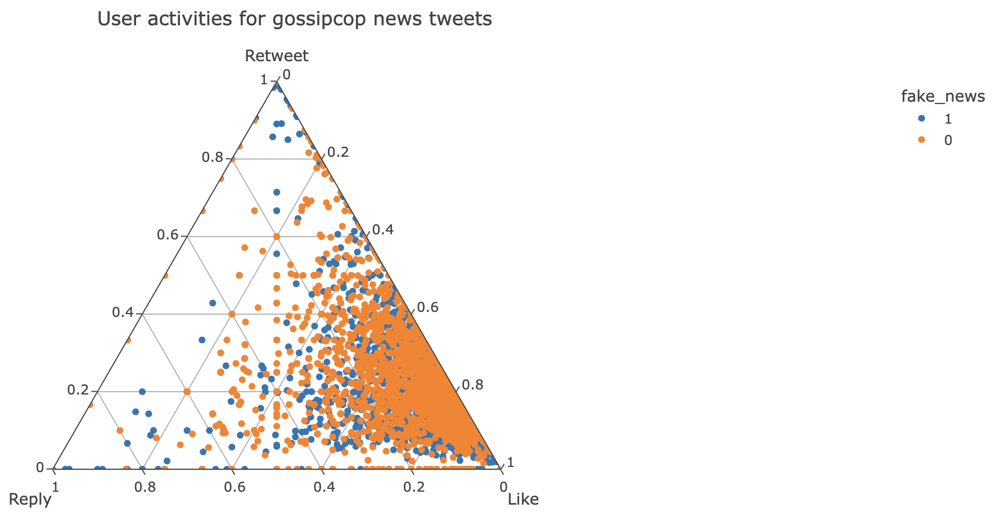

For gossip-related news (gossipcop dataset), the user engagement in both real and fake news are also not too distinguishable. Many data points are concentrated at bottom right corner, indicates more likes but less replies and retweets.

This is because most of the gossips, no matter real or fake is less impactful and just for entertainment purpose, so users are less likely to spend time and effort to reply or retweet the news than simply like the tweets.

# Summary and Next Steps

In this module, we found out that news titles and contents are the fundamental sources to find clues to differentiate fake news pieces. For example, in the data analysis, it has shown that the clickbaits headlines usually included names of celebrities or politicians can serve as a good indicator for recognizing fake news articles.

Secondly, capturing the pattern of user engagements in the early phases of news diffusion such as virality, user activities and posting time could be helpful to achieve the goal of early detection. 

As the next step, we will use these features to develop a binary classification machine learning model to detect fake news efficiently on social media. Several models we would explore in the next module includes logistic regression, ensemble models (random forest and boosting) as well as neural network. We will also apply Natural Language Processing techniques on the content and titles of the articles, the methods we plan to use include: Bag of words, TF-IDF, Word2Vec and pre-trained models on Hugging Face.

#Appendix

1. All materials are saved in this google drive path: https://drive.google.com/drive/folders/1ytwoAT7-3u6-3nGhA_-SRt6hUV_rRRQG?usp=sharing

2. All dataset can be accessed in this folder: https://drive.google.com/drive/folders/1IoTEmVLr9xqy0-L0RgPp7-Mkt9Bu6YMH?usp=sharing

3. For data cleaning on articles (web scrapping, source of the articles) and bag of words pre-analysis on body and title: https://colab.research.google.com/drive/1IVx9ilWwHXQtu2U0PJJOjwbZOl2-hIO1?usp=sharing    

4. For the analysis of the number of tweets per article: https://colab.research.google.com/drive/1b1T8N74-vJurt0pwy2O8vK2FdScjYQdZ?usp=sharing


5. For tweets related data preprocessing and analysis, please refer to google colab notebooks folder (Appendix - Tweet Extraction by snscrape & Appendix - Tweets data preprocessing and analysis) in this folder: https://drive.google.com/drive/folders/1Ki9fswyf9jXYIJQUisrD6Bbn6__C7Me7?usp=sharing